# Wczytanie bibliotek i danych

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from math import floor
from scipy import stats
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.cluster import KMeans
from kneed import KneeLocator
from collections import Counter
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('claims_q12023.csv', sep=';')

In [3]:
data.head()

,cust_age,policy_id,coverage_start_date,cust_region,sum_assured_group,ins_deductible,annual_prem,zip_code,insured_sex,edu_lvl,...,bodily_injuries,witnesses,police_report_avlbl,total_claim_amount,injury_claim,property_claim,vehicle_claim,car_brand,car_model,production_year
0,44,225016,08.09.2007,north,mid,2000,1007.48,342178,F,college,...,0,2,YES,74140,13480,13480,47180,BMW,X5,2022
1,56,316183,02.02.2016,north,mid,500,1080.60,506682,F,phd,...,2,3,NaN,56430,0,6270,50160,Honda,CRV,2021
2,28,174430,04.02.2020,east,mid,2000,1078.03,330854,M,high school,...,0,1,YES,53600,6700,6700,40200,Volkswagen,Jetta,2014
3,53,67527,27.01.2013,north,low,1000,1026.55,502272,F,college,...,0,0,NO,80960,14720,7360,58880,Accura,MDX,2007
4,47,259758,08.04.2015,east,mid,2000,1484.15,515656,F,associate,...,2,3,NaN,64100,12820,6410,44870,Dodge,RAM,2021


# Analiza eksploracyjna

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   cust_age               1000 non-null   int64  
 1   policy_id              1000 non-null   int64  
 2   coverage_start_date    1000 non-null   object 
 3   cust_region            1000 non-null   object 
 4   sum_assured_group      1000 non-null   object 
 5   ins_deductible         1000 non-null   int64  
 6   annual_prem            1000 non-null   float64
 7   zip_code               1000 non-null   int64  
 8   insured_sex            1000 non-null   object 
 9   edu_lvl                1000 non-null   object 
 10  marital_status         1000 non-null   object 
 11  claim_incurred_date    1000 non-null   object 
 12  claim_type             1000 non-null   object 
 13  acc_type               822 non-null    object 
 14  emg_services_notified  1000 non-null   object 
 15  incid

**Identyfikacja liczby unikatowych wartości w każdej kolumnie**

In [5]:
for column in data.columns:
    print(column, data[column].nunique())

cust_age 46
policy_id 1000
coverage_start_date 952
cust_region 3
sum_assured_group 3
ins_deductible 3
annual_prem 991
zip_code 995
insured_sex 2
edu_lvl 7
marital_status 3
claim_incurred_date 60
claim_type 4
acc_type 3
emg_services_notified 5
incident_city 7
incident_hour 24
num_vehicles_involved 4
property_damage 3
bodily_injuries 3
witnesses 4
police_report_avlbl 2
total_claim_amount 763
injury_claim 638
property_claim 627
vehicle_claim 726
car_brand 14
car_model 39
production_year 21


**Usuwanie zmiennych policy_id (zmienna unikatowa, identyfikator) oraz zip_code (995/1000 unikatowych wartości)**

In [6]:
data.drop('zip_code', axis=1, inplace=True)

**Identyfikacja duplikatów po usunięciu identyfikatora**

In [7]:
data.duplicated().sum()  # brak duplikatów

0

**Nadanie odpowiednich typów zmiennym**

In [8]:
data['coverage_start_date'] = (pd.to_datetime(data['coverage_start_date'], format='%d.%m.%Y'))
data['claim_incurred_date'] = (pd.to_datetime(data['claim_incurred_date'], format='%d.%m.%Y'))

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   cust_age               1000 non-null   int64         
 1   policy_id              1000 non-null   int64         
 2   coverage_start_date    1000 non-null   datetime64[ns]
 3   cust_region            1000 non-null   object        
 4   sum_assured_group      1000 non-null   object        
 5   ins_deductible         1000 non-null   int64         
 6   annual_prem            1000 non-null   float64       
 7   insured_sex            1000 non-null   object        
 8   edu_lvl                1000 non-null   object        
 9   marital_status         1000 non-null   object        
 10  claim_incurred_date    1000 non-null   datetime64[ns]
 11  claim_type             1000 non-null   object        
 12  acc_type               822 non-null    object        
 13  emg_

## Charakterystyki zmiennych

**Wyodrębnienie list ze zmiennymi ilościowymi, jakościowymi i mieszanymi (przyjmującymi ograniczone, całkowite wartości liczbowe)**

In [10]:
num = ['cust_age', 'annual_prem', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']
obj = ['cust_region', 'sum_assured_group', 'insured_sex', 'edu_lvl', 'marital_status', 'claim_type', 'acc_type',
       'emg_services_notified', 'incident_city', 'property_damage', 'police_report_avlbl', 'car_brand', 'car_model']
mix = ['ins_deductible', 'incident_hour', 'num_vehicles_involved', 'bodily_injuries', 'witnesses', 'production_year']

### Zmienne ilościowe

In [11]:
data[num].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cust_age,1000.0,38.94800,9.140287,19.00,32.0000,38.00,44.000,64.0
annual_prem,1000.0,1254.51615,244.167395,431.44,1087.7175,1255.31,1413.805,2045.7
total_claim_amount,1000.0,52944.20100,26880.796007,100.00,41812.5000,58055.00,70592.500,151632.0
injury_claim,1000.0,7457.53900,4931.310627,0.00,4295.0000,6775.00,11330.000,24726.0
property_claim,1000.0,7429.98200,4908.125387,0.00,4445.0000,6750.00,10885.000,28054.0
vehicle_claim,1000.0,38056.68000,19210.616078,70.00,30292.5000,42100.00,50822.500,106960.0


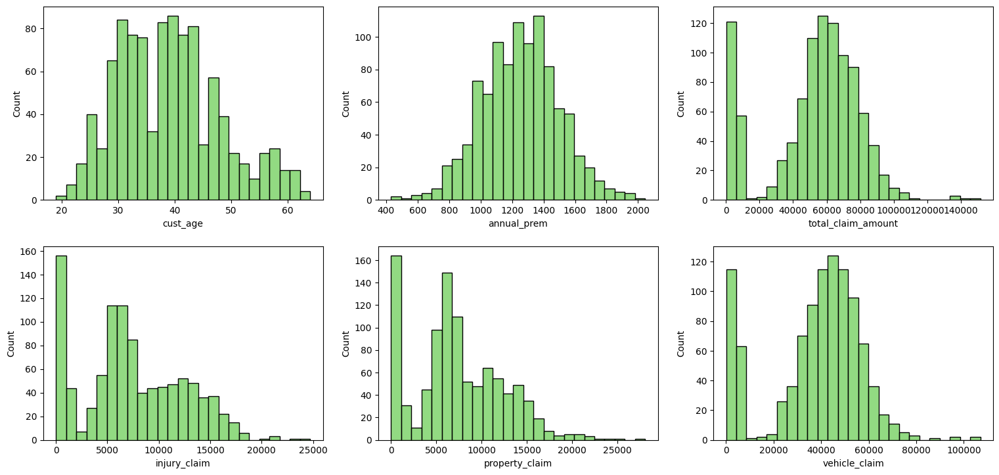

In [12]:
f, axes = plt.subplots(2, 3, figsize=[15, 7])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[num]):
    sns.histplot(x=col, data=data, ax=axes[n // 3, n % 3], bins=25, color='#6ece58')

### Zmienne mieszane

In [13]:
data[mix].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
ins_deductible,1000.0,1136.000,611.864673,500.0,500.0,1000.0,2000.0,2000.0
incident_hour,1000.0,11.644,6.951373,0.0,6.0,12.0,17.0,23.0
num_vehicles_involved,1000.0,1.839,1.018880,1.0,1.0,1.0,3.0,4.0
bodily_injuries,1000.0,0.988,0.818857,0.0,0.0,1.0,2.0,2.0
witnesses,1000.0,1.487,1.111335,0.0,1.0,1.0,2.0,3.0
production_year,1000.0,2012.126,6.015506,2002.0,2007.0,2012.0,2017.0,2022.0


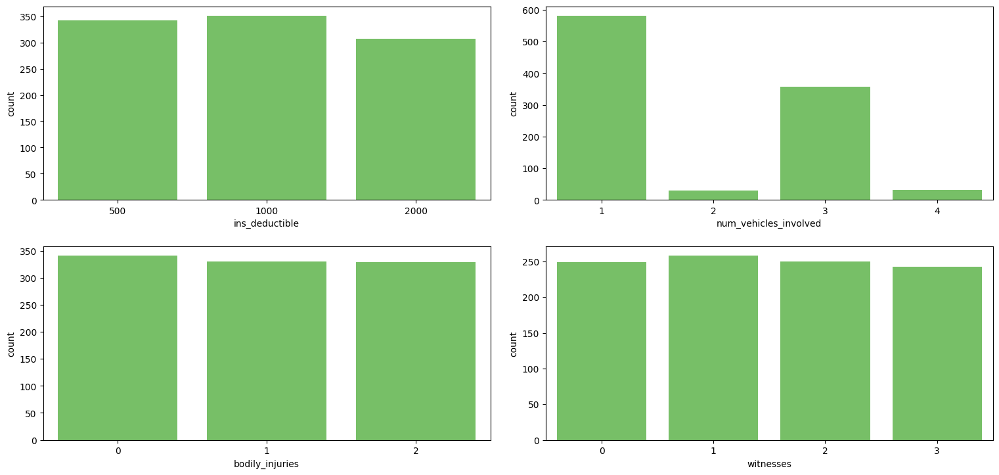

In [14]:
f, axes = plt.subplots(2, 2, figsize=[15, 7])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[mix].drop(['incident_hour', 'production_year'], axis=1)):
    sns.countplot(x=col, data=data, ax=axes[n // 2, n % 2], color='#6ece58')

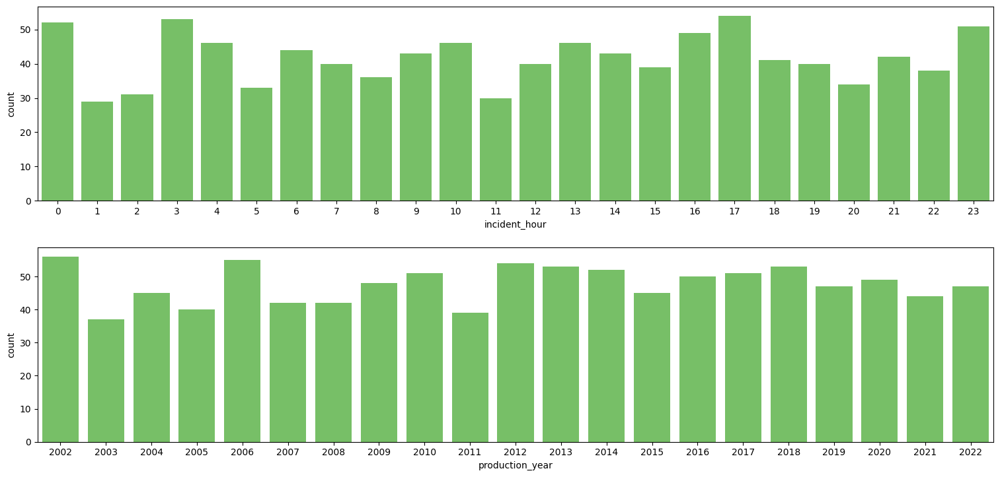

In [15]:
f, axes = plt.subplots(2, 1, figsize=[15, 7])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['incident_hour', 'production_year']]):
    sns.countplot(x=col, data=data, ax=axes[n], color='#6ece58')

### Zmienne jakościowe

In [16]:
data[obj].describe(include=['O']).transpose()

,count,unique,top,freq
cust_region,1000,3,east,352
sum_assured_group,1000,3,mid,349
insured_sex,1000,2,F,535
edu_lvl,1000,7,jd,161
marital_status,1000,3,other,534
claim_type,1000,4,multi-vehicle collision,419
acc_type,822,3,rear collision,292
emg_services_notified,1000,5,Police,292
incident_city,1000,7,Springfield,157
property_damage,1000,3,?,360


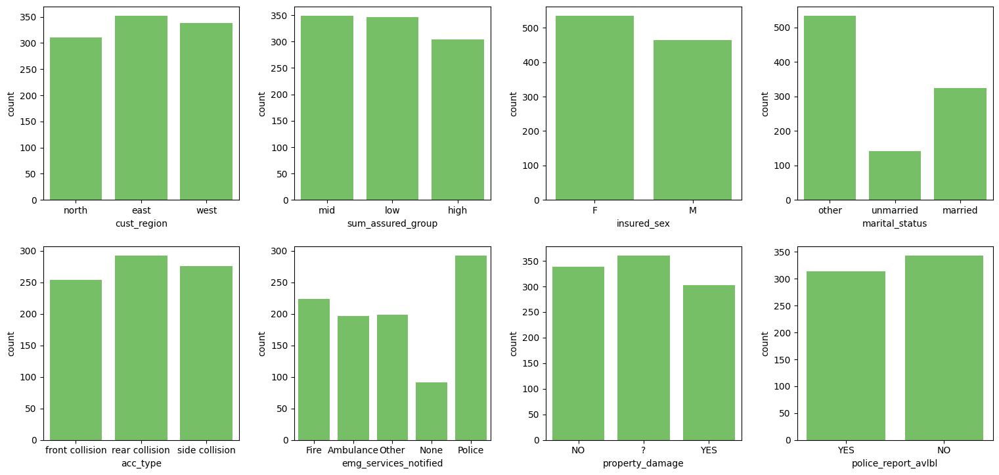

In [17]:
f, axes = plt.subplots(2, 4, figsize=[15, 7])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[obj].drop(['car_brand', 'car_model', 'edu_lvl', 'incident_city', 'claim_type'], axis=1)):
    sns.countplot(x=col, data=data, ax=axes[n // 4, n % 4], color='#6ece58')

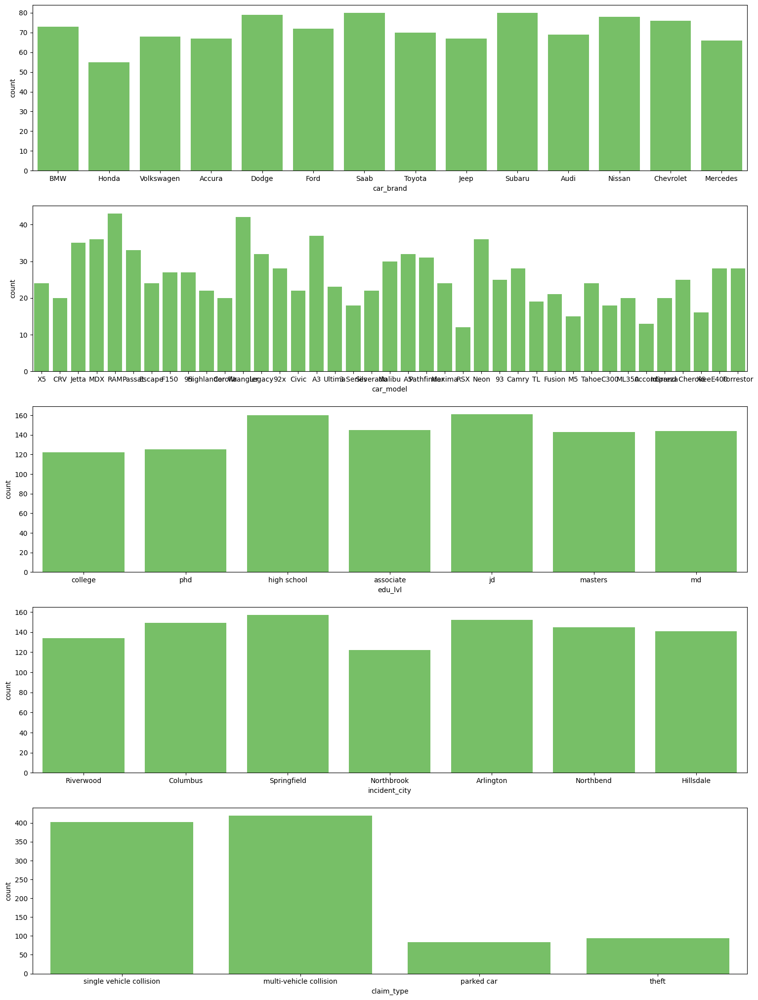

In [18]:
f, axes = plt.subplots(5, 1, figsize=[15, 20])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['car_brand', 'car_model', 'edu_lvl', 'incident_city', 'claim_type']]):
    sns.countplot(x=col, data=data, ax=axes[n], color='#6ece58')

## Zależności w zmiennych

### Zmienne ilościowe

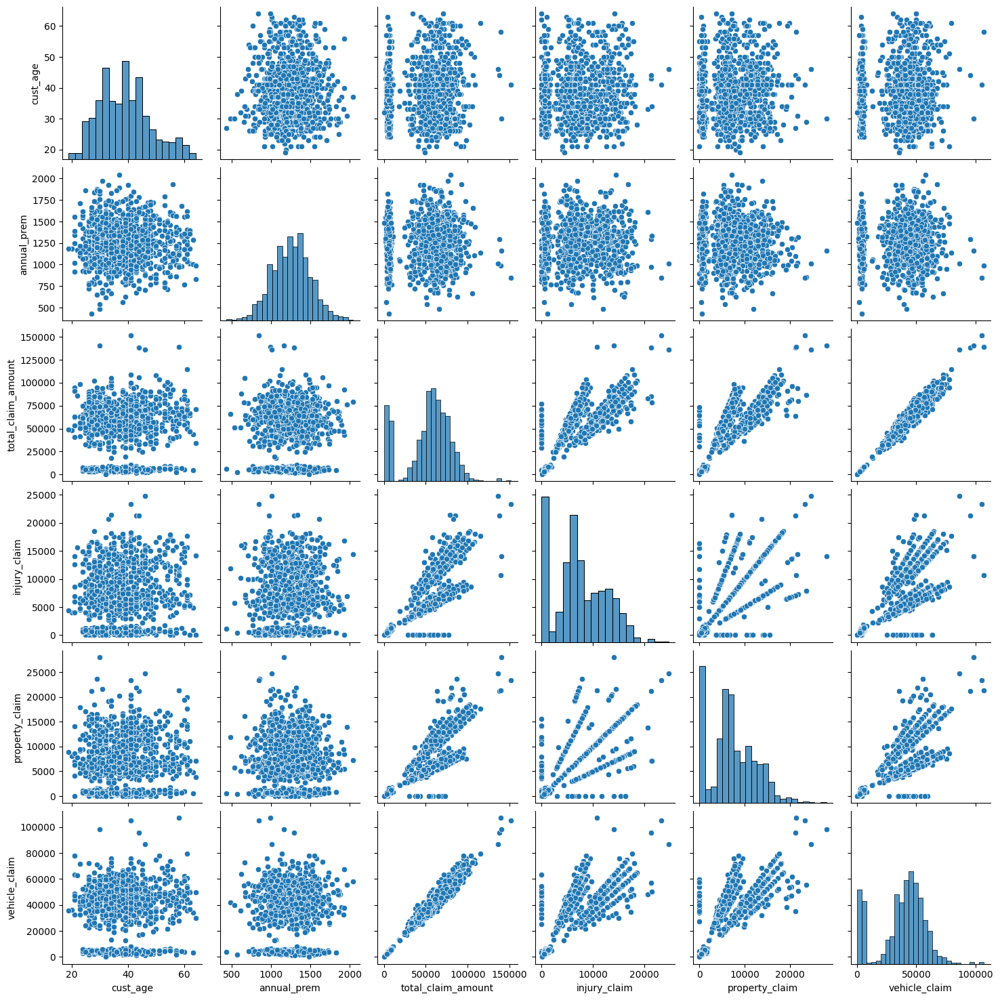

In [19]:
sns.pairplot(data[num])

In [20]:
data[num].corr()

,cust_age,annual_prem,total_claim_amount,injury_claim,property_claim,vehicle_claim
cust_age,1.000000,0.014404,0.072563,0.077251,0.063028,0.065602
annual_prem,0.014404,1.000000,0.003508,-0.021374,-0.016316,0.014564
total_claim_amount,0.072563,0.003508,1.000000,0.807572,0.816935,0.983247
injury_claim,0.077251,-0.021374,0.807572,1.000000,0.572773,0.726974
property_claim,0.063028,-0.016316,0.816935,0.572773,1.000000,0.740592
vehicle_claim,0.065602,0.014564,0.983247,0.726974,0.740592,1.000000


<AxesSubplot: >

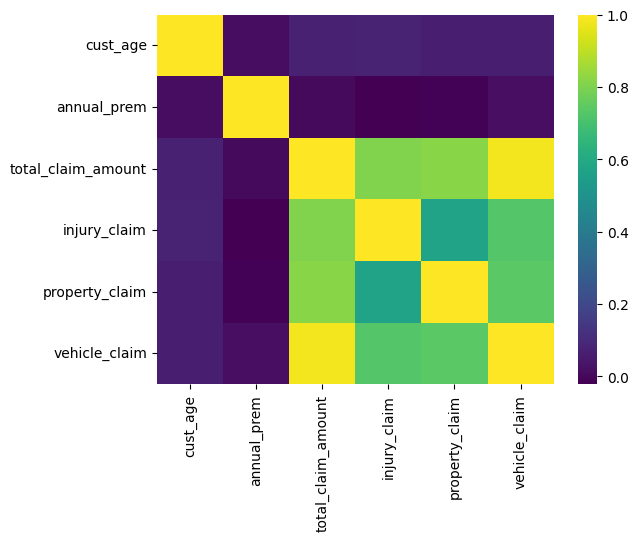

In [21]:
sns.heatmap(data[num].corr(), cmap='viridis')

### Zmienne mieszane

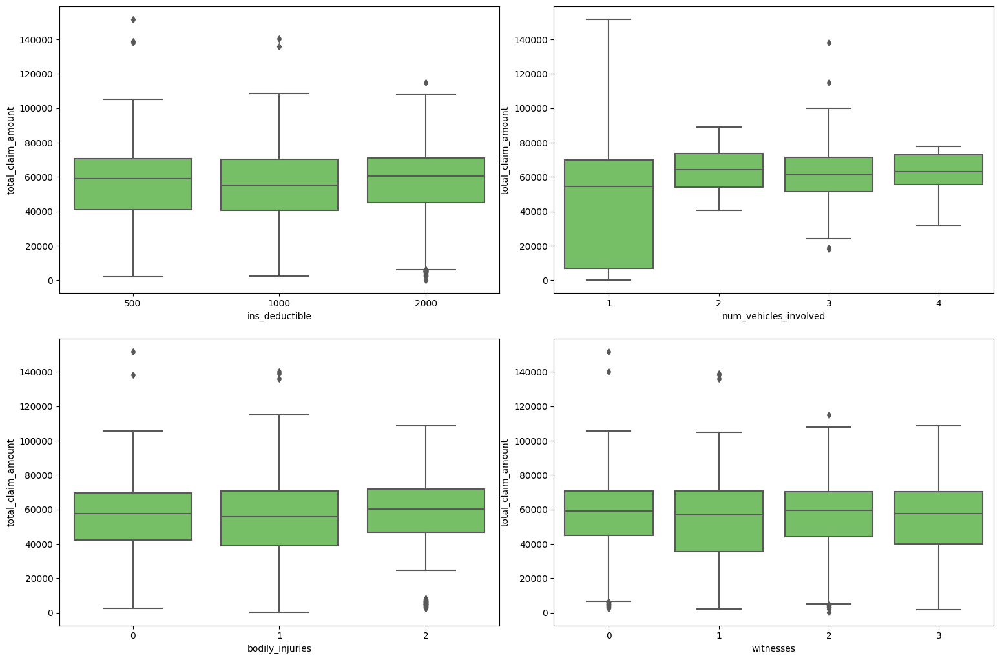

In [22]:
f, axes = plt.subplots(2, 2, figsize=[15, 10])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[mix].drop(['incident_hour', 'production_year'], axis=1)):
    sns.boxplot(x=col, y='total_claim_amount', data=data, ax=axes[n // 2, n % 2], color='#6ece58')

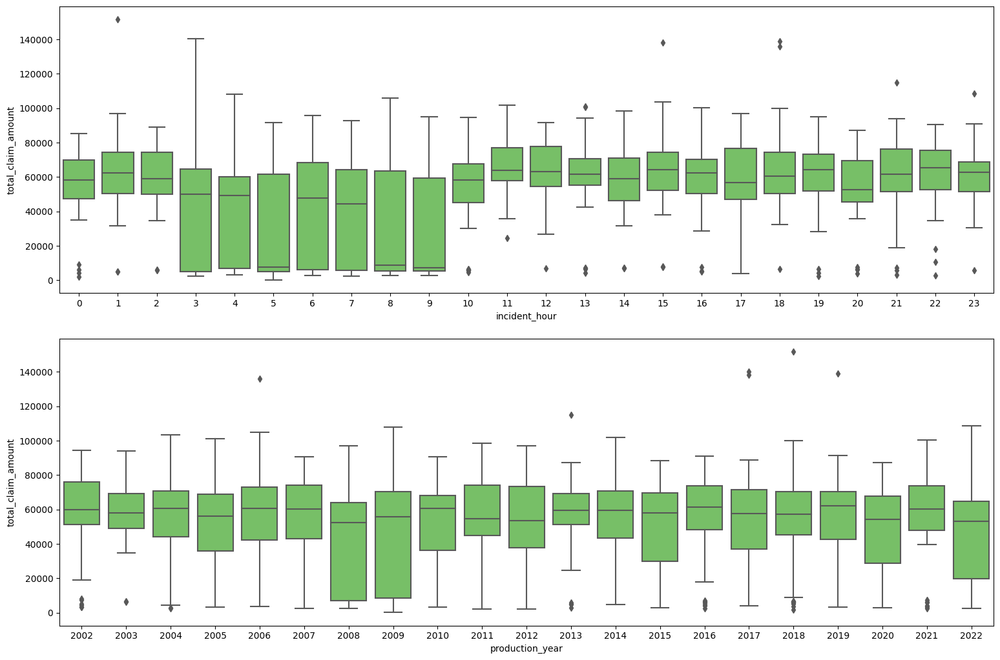

In [23]:
f, axes = plt.subplots(2, 1, figsize=[15, 10])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['incident_hour', 'production_year']]):
    sns.boxplot(x=col, y='total_claim_amount', data=data, ax=axes[n], color='#6ece58')

### Zmienne jakościowe

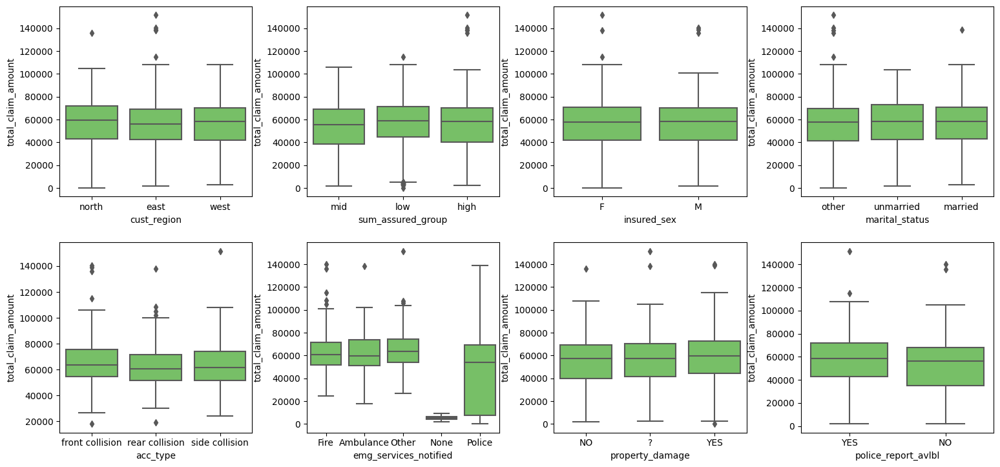

In [24]:
f, axes = plt.subplots(2, 4, figsize=[15, 7])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[obj].drop(['car_brand', 'car_model', 'edu_lvl', 'incident_city', 'claim_type'], axis=1)):
    sns.boxplot(x=col, y='total_claim_amount', data=data, ax=axes[n // 4, n % 4], color='#6ece58')

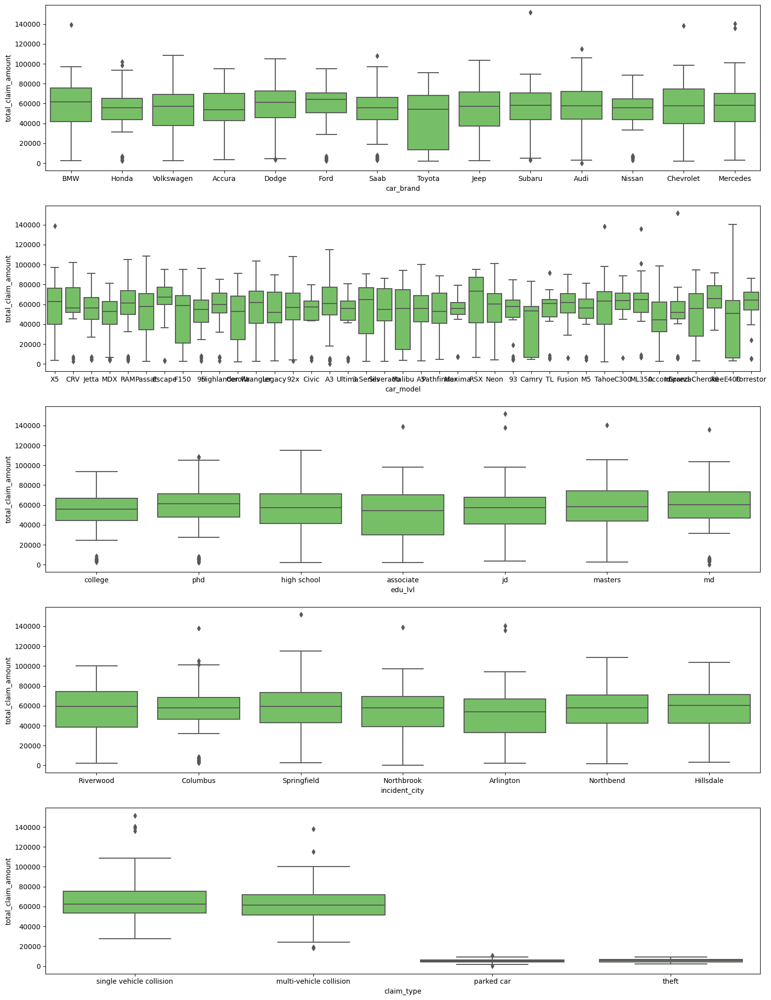

In [25]:
f, axes = plt.subplots(5, 1, figsize=[15, 20])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['car_brand', 'car_model', 'edu_lvl', 'incident_city', 'claim_type']]):
    sns.boxplot(x=col, y='total_claim_amount', data=data, ax=axes[n], color='#6ece58')

## Tworzenie nowych zmiennych

**coverage_start_year** - rok rozpoczęcia ochrony ubezpieczeniowej

In [26]:
data['coverage_start_year'] = data['coverage_start_date'].apply(lambda x: x.year)

**is_not_first_vehicle** - zmienna binarna przyjmująca wartość 1, jeżeli rok produkcji jest późniejszy niż rok powstania polisy, 0 w przeciwnym przypadku

In [27]:
data['is_not_first_vehicle'] = np.where(data['coverage_start_year'] < data['production_year'], 1, 0)

In [28]:
data['is_not_first_vehicle'].value_counts()

1    606
0    394
Name: is_not_first_vehicle, dtype: int64

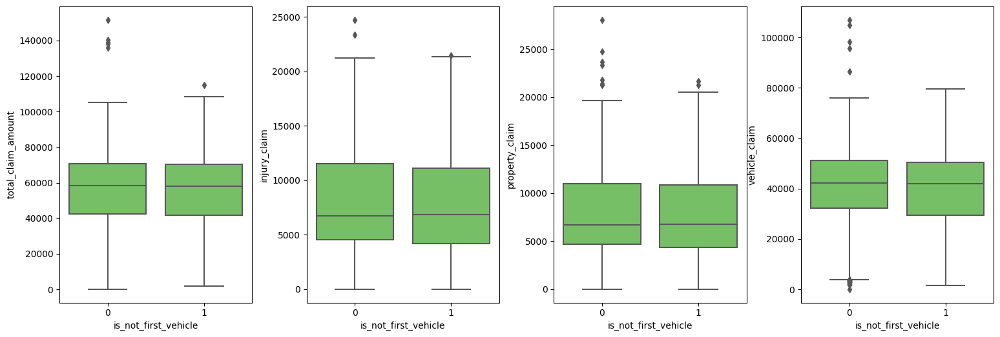

In [29]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='is_not_first_vehicle', y=col, data=data, ax=axes[n], color='#6ece58')

**vehicle_age_start** - wiek samochodu w momencie rozpoczęcia ochrony ubezpieczeniowej; samochody wyprodukowane po rozpoczęciu ochrony mają przypisaną wartość 0

In [30]:
data['vehicle_age_start'] = data['coverage_start_year'] - data['production_year']
data['vehicle_age_start'] = np.where(data['vehicle_age_start'] < 0, 0, data['vehicle_age_start'])

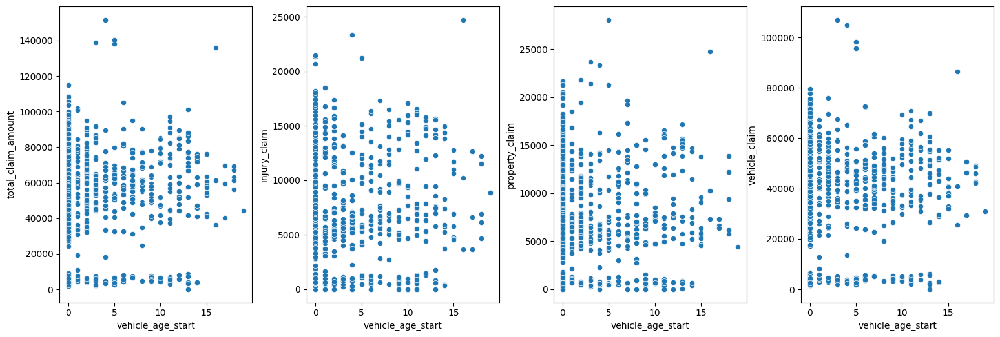

In [31]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.scatterplot(x='vehicle_age_start', y=col, data=data, ax=axes[n])

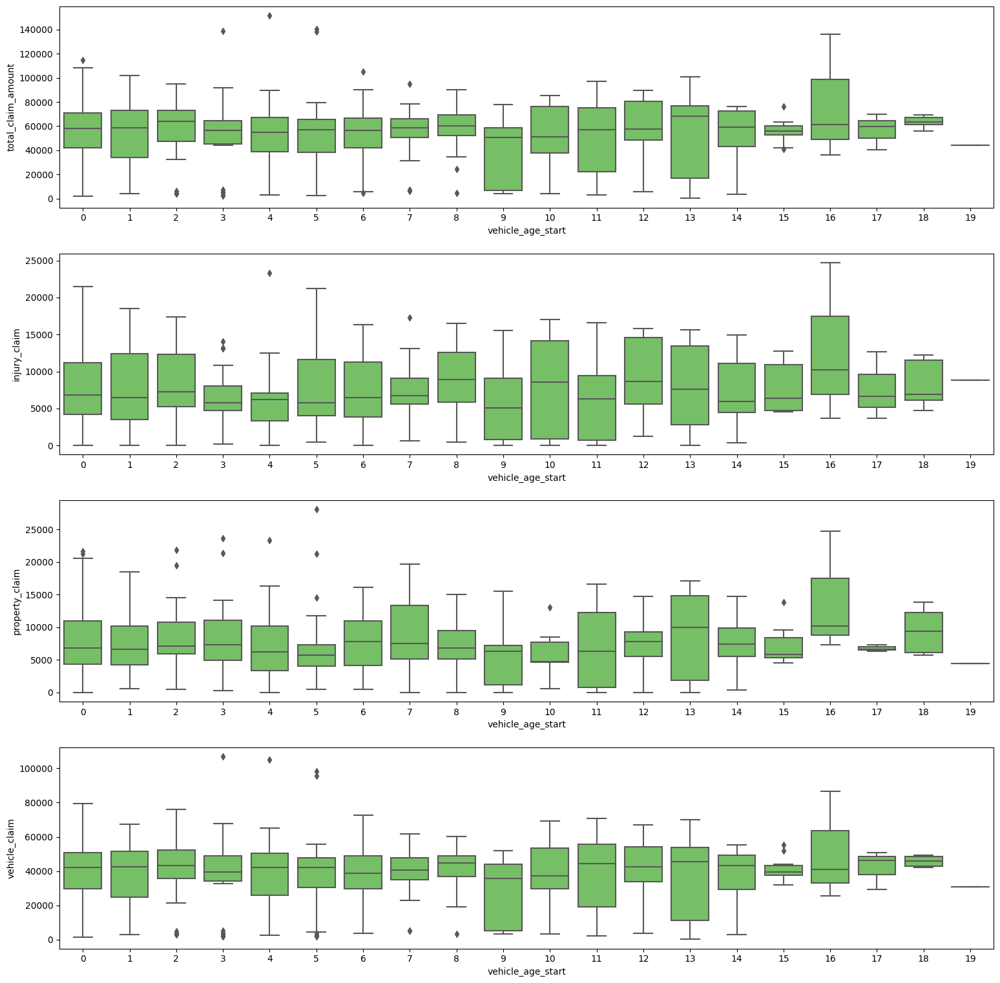

In [32]:
f, axes = plt.subplots(4, 1, figsize=[15, 15])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='vehicle_age_start', y=col, data=data, ax=axes[n], color='#6ece58')

**vehicle_age_acc** - wiek samochodu w momencie wypadku

In [33]:
data['vehicle_age_acc'] = 2023 - data['production_year']

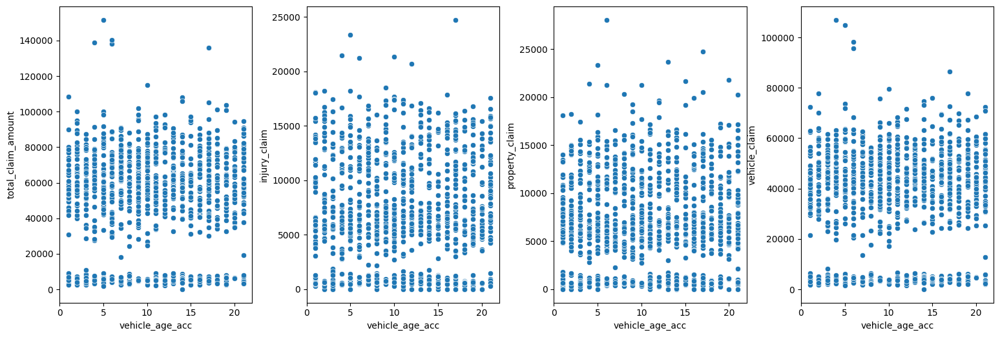

In [34]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.scatterplot(x='vehicle_age_acc', y=col, data=data, ax=axes[n])

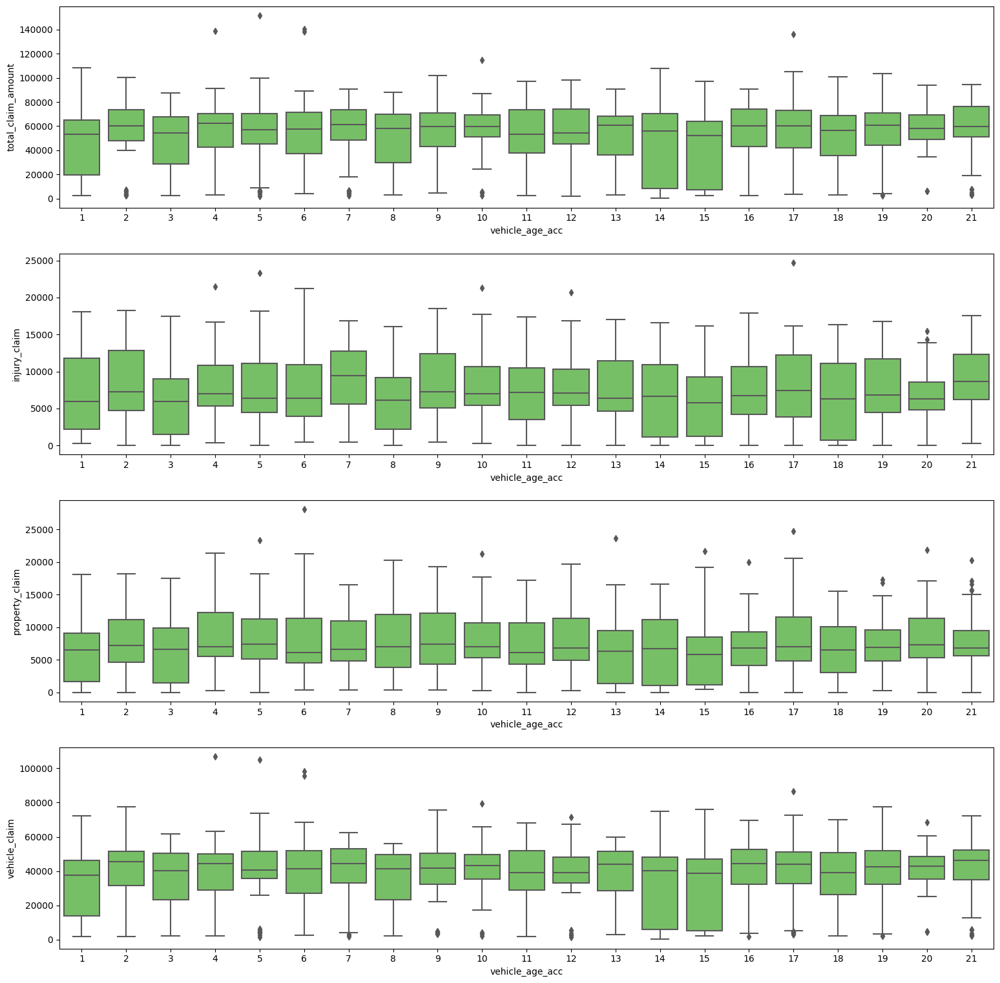

In [35]:
f, axes = plt.subplots(4, 1, figsize=[15, 15])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='vehicle_age_acc', y=col, data=data, ax=axes[n], color='#6ece58')

**cust_age_acc** - wiek klienta w momencie zdarzenia

In [36]:
data['cust_age_acc'] = data['cust_age'] + (2023 - data['coverage_start_year'])

In [37]:
data[['cust_age', 'cust_age_acc', 'coverage_start_year']].head(3)

,cust_age,cust_age_acc,coverage_start_year
0,44,60,2007
1,56,63,2016
2,28,31,2020


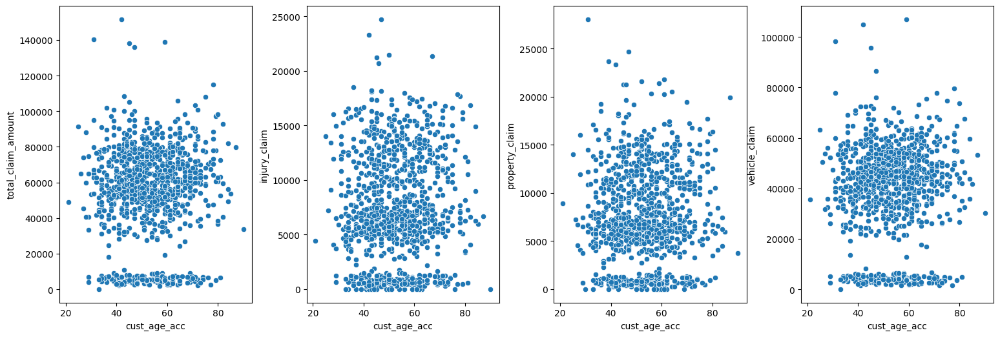

In [38]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.scatterplot(x='cust_age_acc', y=col, data=data, ax=axes[n])

**months_between** - liczba miesięcy od rozpoczęcia ochrony ubezpieczeniowej do zajścia zdarzenia

In [39]:
data['months_between'] = ((pd.to_datetime(data['claim_incurred_date'], format='%d.%m.%Y') - pd.to_datetime(data['coverage_start_date'], format='%d.%m.%Y'))/np.timedelta64(1, 'M'))
data['months_between'] = data['months_between'].apply(lambda x: floor(x))
data['months_between'].head()

0    185
1     84
2     36
3    119
4     93
Name: months_between, dtype: int64

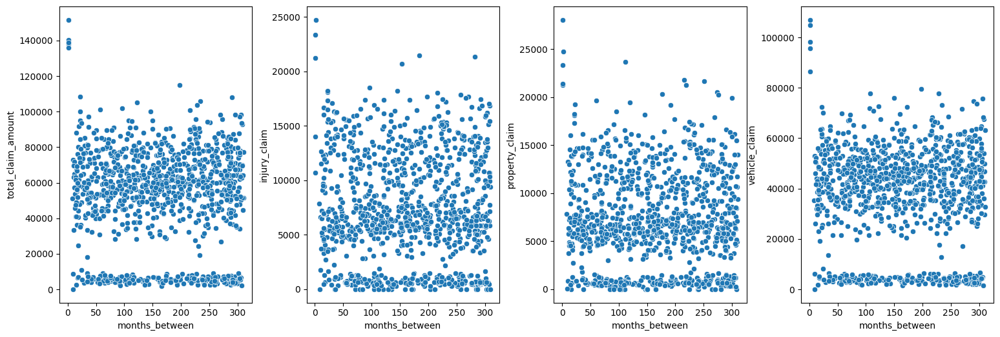

In [40]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.scatterplot(x='months_between', y=col, data=data, ax=axes[n])

**emg_services_notified** - zmienną przekodowano, kategorie 'Fire', 'Ambulance' oraz 'Other' zgrupowane w jedną kategorię ze względu na porównywalny poziom szkód

In [41]:
data['emg_services_notified'] = data['emg_services_notified'].map({'Fire':'Other', 'Ambulance':'Other', 
                                                               'Other':'Other', 'Police':'Police', 'None':'None'})
data['emg_services_notified'].value_counts()

Other     617
Police    292
None       91
Name: emg_services_notified, dtype: int64

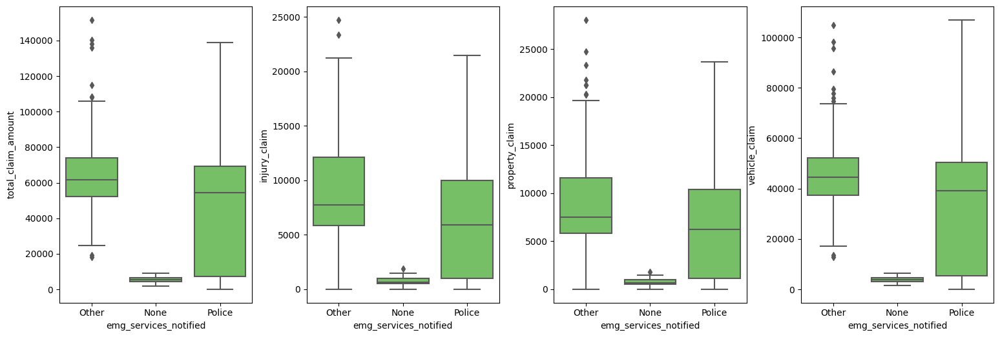

In [42]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='emg_services_notified', y=col, data=data, ax=axes[n], color='#6ece58')

**is_accident** - zmienna binarna przyjmująca wartość 1, jeżeli zdarzenie było wypadkiem samochodowym, 0 w przeciwnym przypadku

In [43]:
data['is_accident'] = data['claim_type'].map({'multi-vehicle collision':1, 'single vehicle collision':1,
                                         'theft':0, 'parked car':0})
data['is_accident'].value_counts()

1    822
0    178
Name: is_accident, dtype: int64

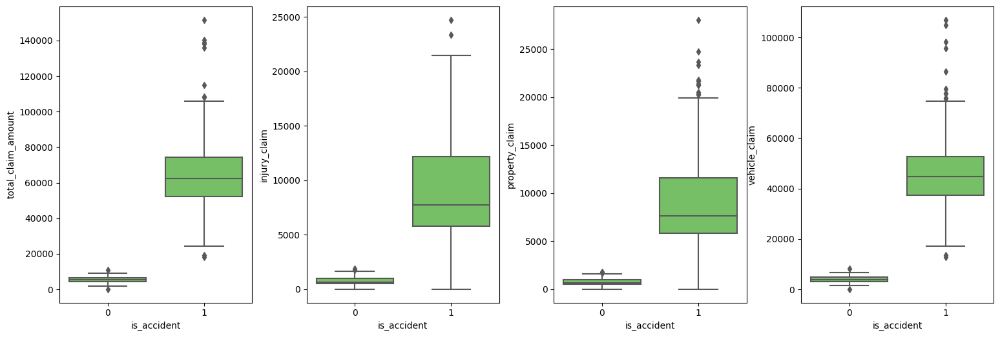

In [44]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='is_accident', y=col, data=data, ax=axes[n], color='#6ece58')

**police_report_NAN** - uzupełnienie braków danych w kolumnie police_report_avlbl wartością 'NAN' informującą o braku danych o zmiennej dla danej obserwacji

In [45]:
data['police_report_NAN'] = data['police_report_avlbl']
data['police_report_NAN'].fillna('NAN', inplace=True)
data['police_report_NAN'].value_counts()

NAN    343
NO     343
YES    314
Name: police_report_NAN, dtype: int64

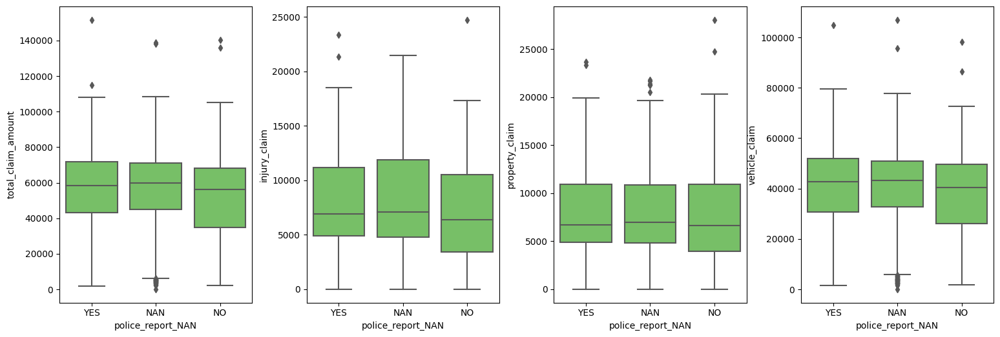

In [46]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='police_report_NAN', y=col, data=data, ax=axes[n], color='#6ece58')


**acc_type** - przekodowanie zmiennej; dodano kategorię 'NAN', ponieważ braki danych wiążą się z informacją o średnio niższej wysokości szkód

acc_type_NAN' - zmienna pomocnicza

In [47]:
data['acc_type_NAN'] = data['acc_type']
data['acc_type_NAN'].fillna('NAN', inplace=True)
data['acc_type_NAN'].value_counts()

rear collision     292
side collision     276
front collision    254
NAN                178
Name: acc_type_NAN, dtype: int64

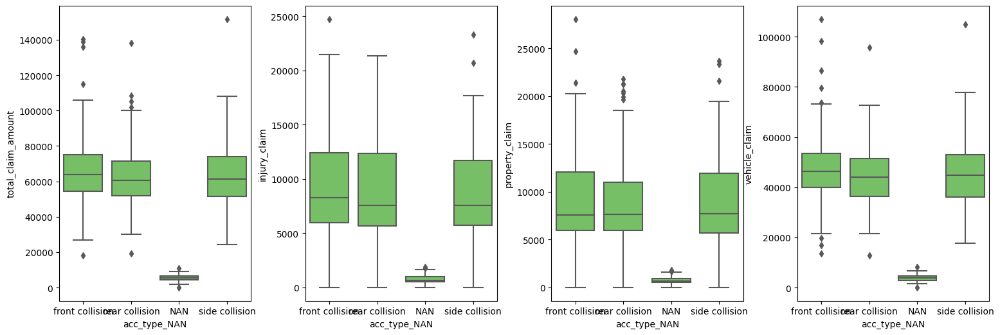

In [48]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='acc_type_NAN', y=col, data=data, ax=axes[n], color='#6ece58')

In [49]:
data.drop('acc_type_NAN', axis=1, inplace=True)
data['acc_type'].fillna('NAN', inplace=True)
data['acc_type'].value_counts()

rear collision     292
side collision     276
front collision    254
NAN                178
Name: acc_type, dtype: int64

**injury_claim_proc, property_claim_proc, vehicle_claim_proc** - zmienne określające udział zmiennych injury_claim, property_claim i  vehicle_claim w zmiennej total_claim_amount

In [50]:
data['injury_claim_proc'] = data['injury_claim']/data['total_claim_amount']
data['property_claim_proc'] = data['property_claim']/data['total_claim_amount']
data['vehicle_claim_proc'] = data['vehicle_claim']/data['total_claim_amount']

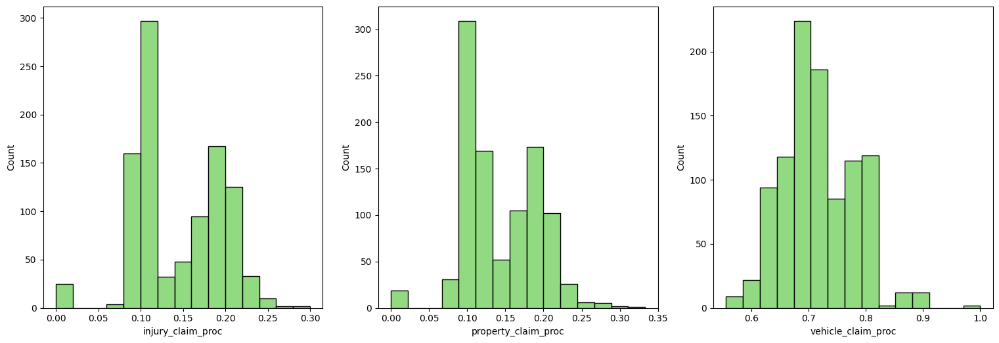

In [51]:
f, axes = plt.subplots(1, 3, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['injury_claim_proc', 'property_claim_proc', 'vehicle_claim_proc']]):
    sns.histplot(x=col, data=data, ax=axes[n], bins=15, color='#6ece58')

**incident_time_39** - czy wypadek wydarzył się w godzinach 3-9, zmienna binarna

In [52]:
data['incident_time_39'] = data['incident_hour'].map({3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 
                                                      0:0, 1:0, 2:0, 10:0, 11:0, 12:0, 13:0, 14:0, 15:0,
                                                      16:0, 17:0, 18:0, 19:0, 20:0, 21:0, 22:0, 23:0})

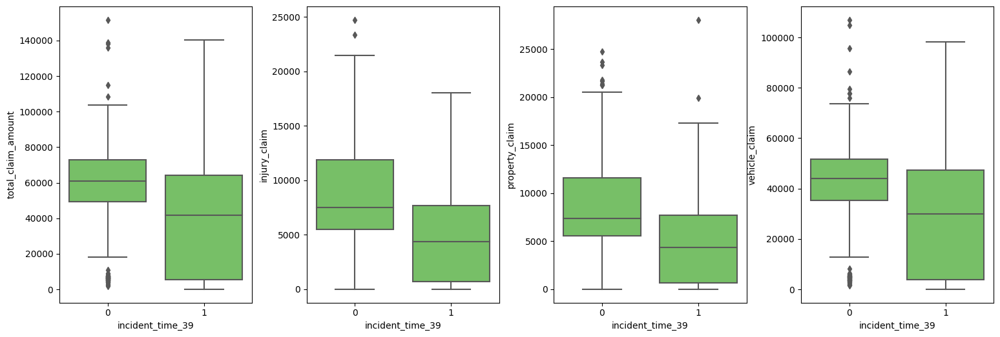

In [53]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='incident_time_39', y=col, data=data, ax=axes[n], color='#6ece58')

**incident_day_of_week** - dzień tygodnia zdarzenia

In [54]:
data['incident_day_of_week'] = data['claim_incurred_date'].apply(lambda x: x.weekday())

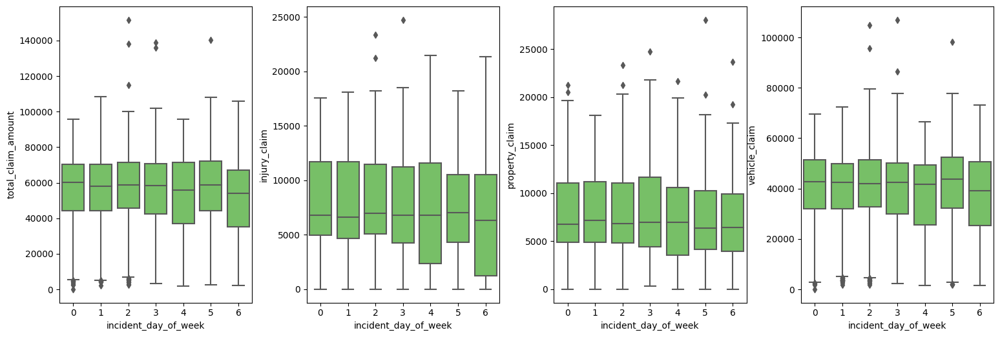

In [55]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='incident_day_of_week', y=col, data=data, ax=axes[n], color='#6ece58')

**1_vehicle_involved** - zmienna binarna, 1 - tylko jeden pojazd w zdarzeniu, 0 -więcej pojazdów

In [56]:
data['1_vehicle_involved'] = data['num_vehicles_involved'].map({1:1, 2:0, 3:0, 4:0})

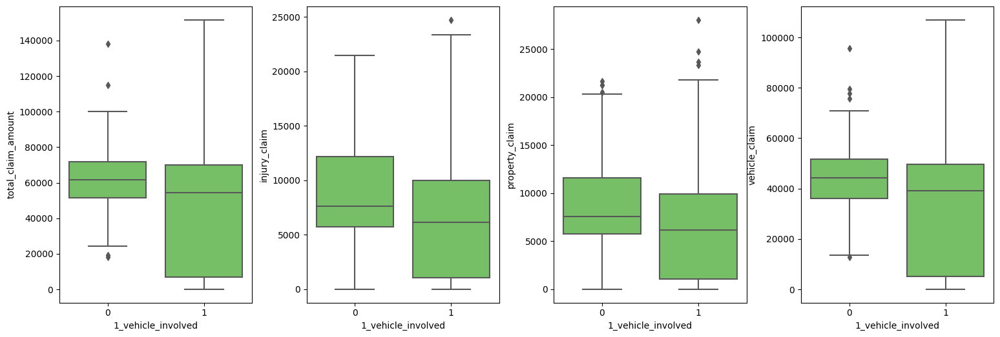

In [57]:
f, axes = plt.subplots(1, 4, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)
for n, col in enumerate(data[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]):
    sns.boxplot(x='1_vehicle_involved', y=col, data=data, ax=axes[n], color='#6ece58')

# Segmentacja

### Zbiór danych do segmentacji

In [58]:
kmeans = ['cust_age', 'months_between', 'insured_sex', 'is_accident', 'emg_services_notified', 'property_damage',
         '1_vehicle_involved', 'incident_hour', 'bodily_injuries', 'total_claim_amount', 'injury_claim']

fraud = ['sum_sssured_group', 'annual_prem', 'witnesses', 'police_report_NAN', 'is_not_first_vehicle',
        'vehicle_age_acc']


In [59]:
df = data[kmeans]

In [60]:
df.head()

,cust_age,months_between,insured_sex,is_accident,emg_services_notified,property_damage,1_vehicle_involved,incident_hour,bodily_injuries,total_claim_amount,injury_claim
0,44,185,F,1,Other,NO,1,19,0,74140,13480
1,56,84,F,1,Other,?,0,12,2,56430,0
2,28,36,M,1,Other,?,1,1,0,53600,6700
3,53,119,F,1,Other,?,1,12,0,80960,14720
4,47,93,F,1,Other,NO,0,1,2,64100,12820


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   cust_age               1000 non-null   int64 
 1   months_between         1000 non-null   int64 
 2   insured_sex            1000 non-null   object
 3   is_accident            1000 non-null   int64 
 4   emg_services_notified  1000 non-null   object
 5   property_damage        1000 non-null   object
 6   1_vehicle_involved     1000 non-null   int64 
 7   incident_hour          1000 non-null   int64 
 8   bodily_injuries        1000 non-null   int64 
 9   total_claim_amount     1000 non-null   int64 
 10  injury_claim           1000 non-null   int64 
dtypes: int64(8), object(3)
memory usage: 86.1+ KB


#### Przekodowanie na binarne zmiennych jakościowych

In [62]:
ohe = OneHotEncoder(sparse_output=False)
ohe_data = ohe.fit_transform(df.select_dtypes('O'))
ohe_data = pd.DataFrame(data=ohe_data, columns=ohe.get_feature_names_out())

In [63]:
df = pd.concat([df.select_dtypes(exclude='O'), ohe_data], axis=1)

In [64]:
df = df.astype({'insured_sex_F': 'int', 'insured_sex_M': 'int', 'emg_services_notified_None': 'int', 
                'emg_services_notified_Other': 'int', 'emg_services_notified_Police': 'int', 
                'property_damage_?': 'int', 'property_damage_NO': 'int', 'property_damage_YES': 'int', })

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   cust_age                      1000 non-null   int64
 1   months_between                1000 non-null   int64
 2   is_accident                   1000 non-null   int64
 3   1_vehicle_involved            1000 non-null   int64
 4   incident_hour                 1000 non-null   int64
 5   bodily_injuries               1000 non-null   int64
 6   total_claim_amount            1000 non-null   int64
 7   injury_claim                  1000 non-null   int64
 8   insured_sex_F                 1000 non-null   int32
 9   insured_sex_M                 1000 non-null   int32
 10  emg_services_notified_None    1000 non-null   int32
 11  emg_services_notified_Other   1000 non-null   int32
 12  emg_services_notified_Police  1000 non-null   int32
 13  property_damage_?             1000

#### Usuwanie obserwacji odstających

In [66]:
print(df.shape)
df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]      # PARAMETR DO DOSTOSOWANIA, IM MNIEJSZY TYM WIĘCEJ USUWA
print(df.shape)

(1000, 16)
(904, 16)


In [67]:
df.reset_index(inplace=True, drop=True)

#### Skalowanie zmiennych

In [68]:
scaler = StandardScaler()

In [69]:
to_scale = ['cust_age', 'months_between', 'incident_hour', 'bodily_injuries', 'total_claim_amount', 'injury_claim']
scaler.fit(df[to_scale])
scaled_features = scaler.transform(df[to_scale])

In [70]:
df_feat = pd.DataFrame(scaled_features, columns=df[to_scale].columns)

In [71]:
df_feat.head()

,cust_age,months_between,incident_hour,bodily_injuries,total_claim_amount,injury_claim
0,0.543023,0.233907,0.990451,-1.21537,0.748959,1.178035
1,1.850036,-0.901662,-0.009800,1.21537,-0.036240,-1.756365
2,-1.199662,-1.441339,-1.581624,-1.21537,-0.161712,-0.297873
3,1.523282,-0.508148,-0.009800,-1.21537,1.051334,1.447965
4,0.869776,-0.800473,-1.581624,1.21537,0.303821,1.034362


In [72]:
df.drop(to_scale, axis=1, inplace=True)

In [73]:
df = pd.concat([df_feat, df], axis=1)

In [74]:
df.head()

,cust_age,months_between,incident_hour,bodily_injuries,total_claim_amount,injury_claim,is_accident,1_vehicle_involved,insured_sex_F,insured_sex_M,emg_services_notified_None,emg_services_notified_Other,emg_services_notified_Police,property_damage_?,property_damage_NO,property_damage_YES
0,0.543023,0.233907,0.990451,-1.21537,0.748959,1.178035,1,1,1,0,0,1,0,0,1,0
1,1.850036,-0.901662,-0.009800,1.21537,-0.036240,-1.756365,1,0,1,0,0,1,0,1,0,0
2,-1.199662,-1.441339,-1.581624,-1.21537,-0.161712,-0.297873,1,1,0,1,0,1,0,1,0,0
3,1.523282,-0.508148,-0.009800,-1.21537,1.051334,1.447965,1,1,1,0,0,1,0,1,0,0
4,0.869776,-0.800473,-1.581624,1.21537,0.303821,1.034362,1,0,1,0,0,1,0,0,1,0


## Model K-Means

**Wybór optymalnej liczby klastrów**

In [75]:
kmeans_num = ['cust_age', 'months_between', 'incident_hour', 'total_claim_amount', 'injury_claim']

In [76]:
data_num = df[kmeans_num]

In [77]:
wss = []
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(data_num)
    wss.append(kmeans.inertia_)

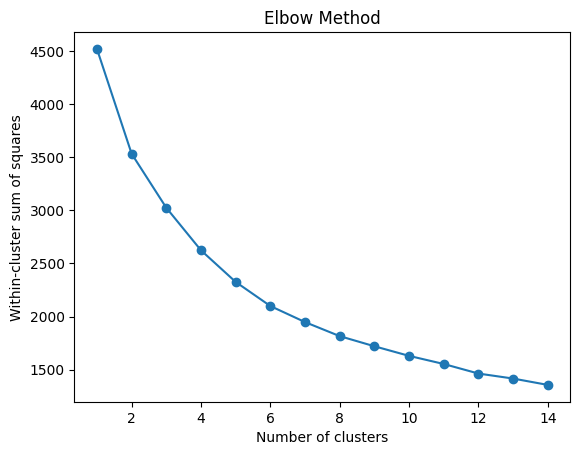

In [78]:
# Wykres
plt.plot(range(1, 15), wss, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Within-cluster sum of squares')
plt.title('Elbow Method')
plt.show()

In [79]:
#pomocnicza funkcja określająca optymlaną liczbę klastrów
kl = KneeLocator(range(1, 15), wss, curve="convex", direction="decreasing")

kl.elbow

5

**KMeans z 5 klastrami**

In [80]:
kmeans_5 = KMeans(
    n_clusters=5,
    random_state=42, n_init=10
).fit(data_num)

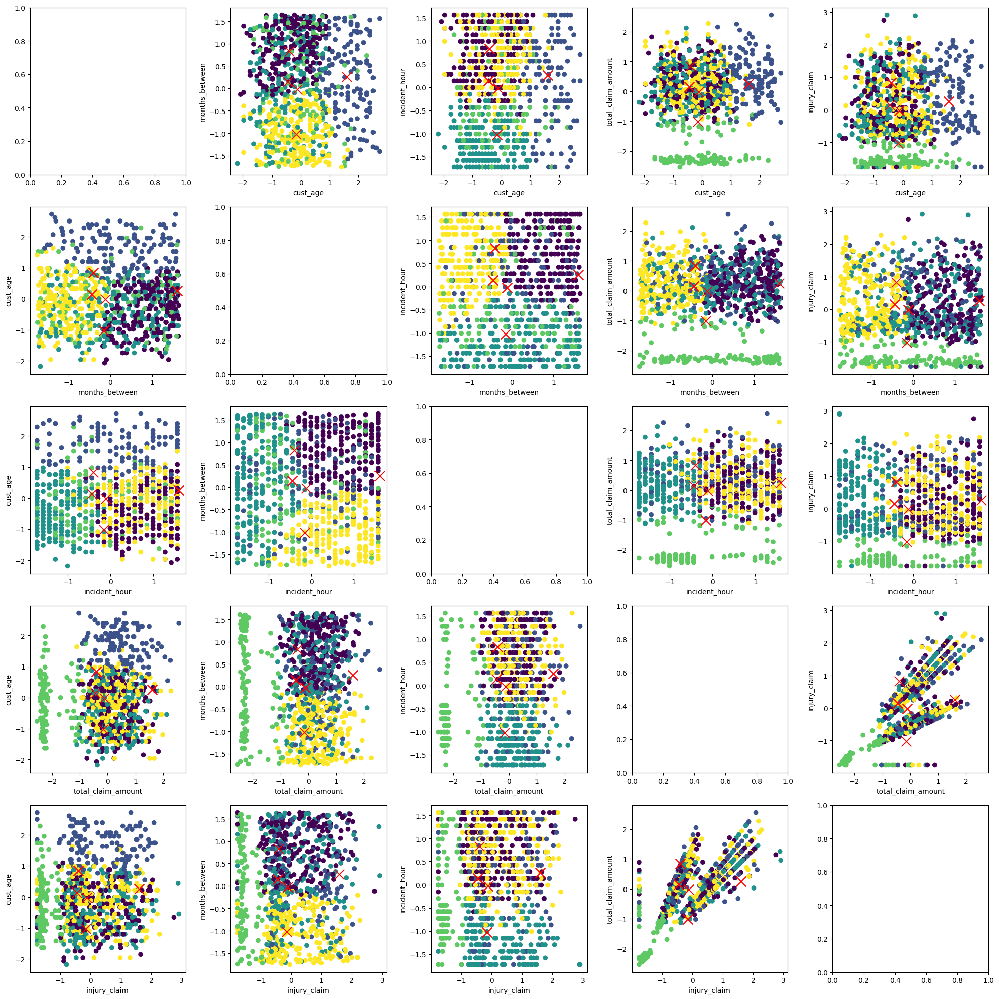

In [81]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

for i in range(5):
    for j in range(5):
        if i == j:
            continue
        else:
            ax = axes[i, j]
            ax.scatter(data_num[data_num.columns[[i]]], data_num[data_num.columns[[j]]], c=kmeans_5.labels_)
            ax.scatter(kmeans_5.cluster_centers_[:, 0], kmeans_5.cluster_centers_[:, 1], marker='x', color='red', s=200)
            ax.set_xlabel(data_num.columns[i])
            ax.set_ylabel(data_num.columns[j])
plt.tight_layout()
plt.show()

**Kmeans z 4 klastrami**

In [82]:
kmeans_4 = KMeans(
    n_clusters=4,
    random_state=42, n_init=10
).fit(data_num)

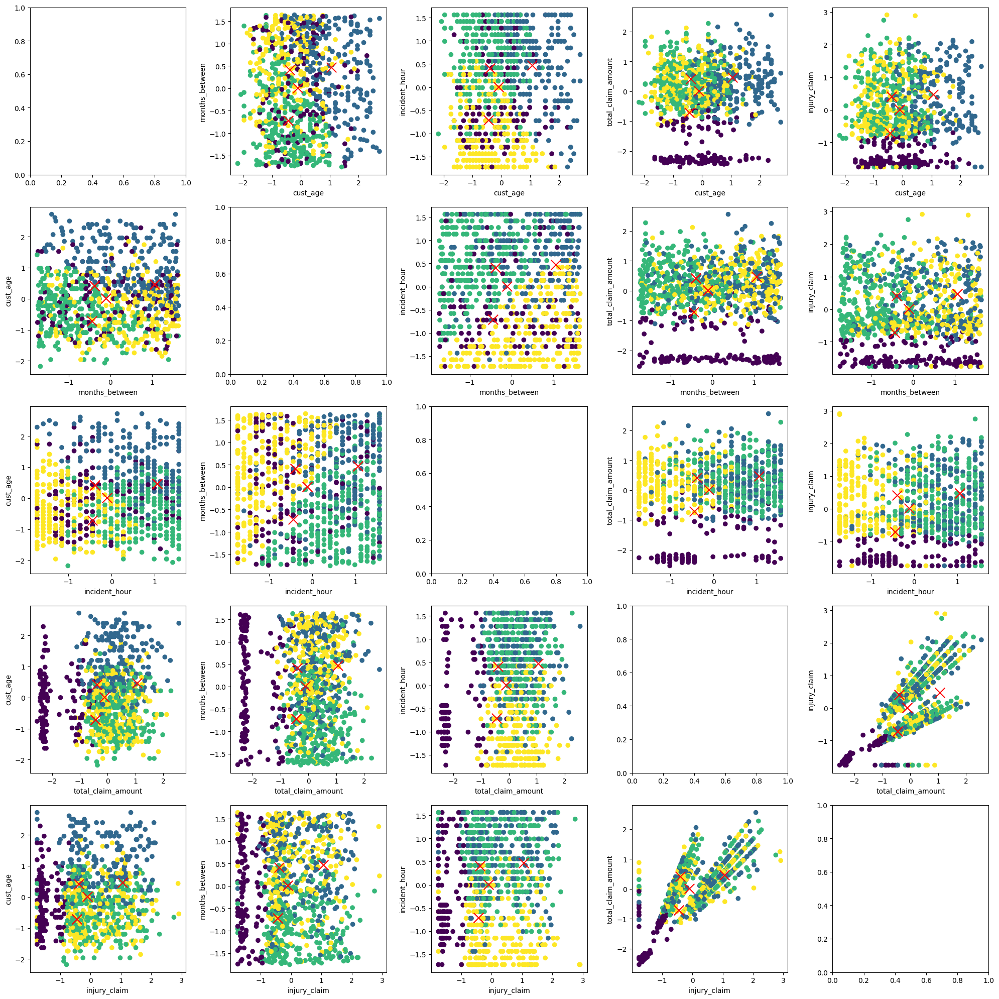

In [83]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

for i in range(5):
    for j in range(5):
        if i == j:
            continue
        else:
            ax = axes[i, j]
            ax.scatter(data_num[data_num.columns[[i]]], data_num[data_num.columns[[j]]], c=kmeans_4.labels_)
            ax.scatter(kmeans_4.cluster_centers_[:, 0], kmeans_4.cluster_centers_[:, 1], marker='x', color='red', s=200)
            ax.set_xlabel(data_num.columns[i])
            ax.set_ylabel(data_num.columns[j])
plt.tight_layout()
plt.show()

**Kmeans z 3 klastrami**

In [84]:
kmeans_3 = KMeans(
    n_clusters=3,
    random_state=42, n_init=10
).fit(data_num)

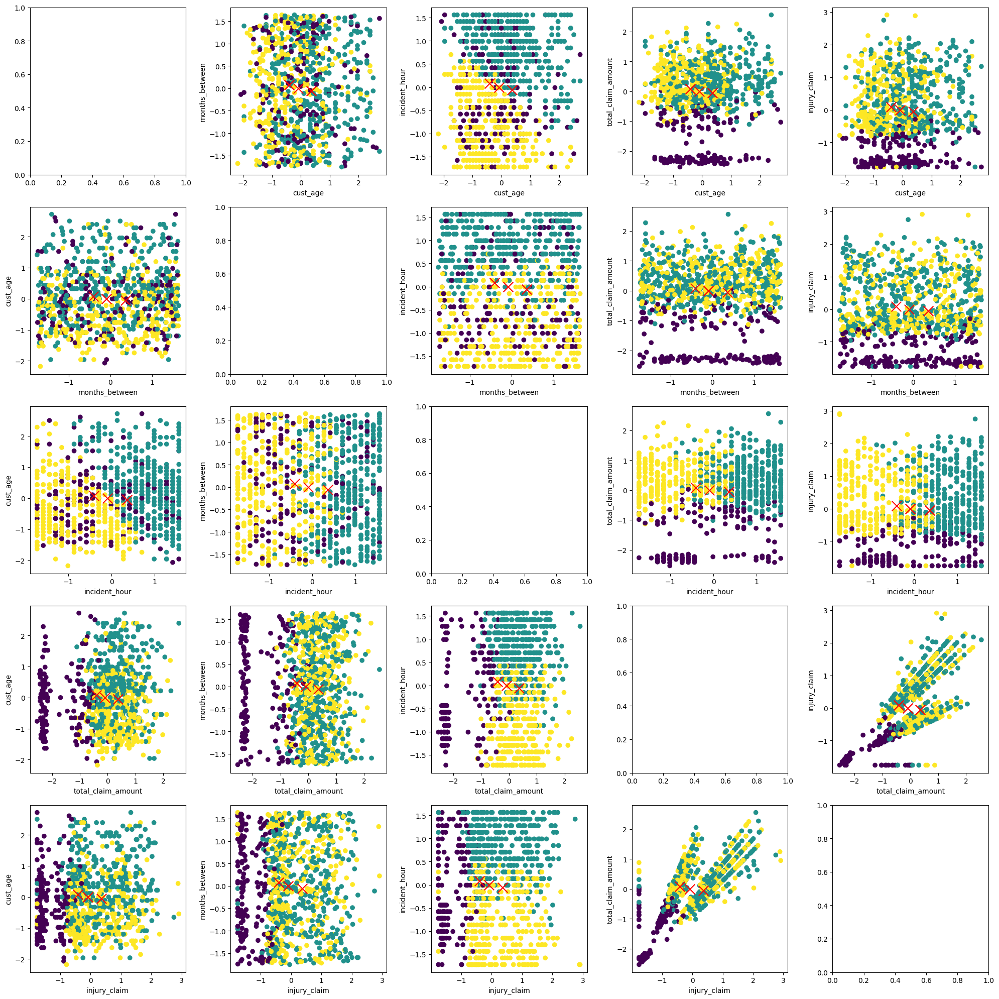

In [85]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

for i in range(5):
    for j in range(5):
        if i == j:
            continue
        else:
            ax = axes[i, j]
            ax.scatter(data_num[data_num.columns[[i]]], data_num[data_num.columns[[j]]], c=kmeans_3.labels_)
            ax.scatter(kmeans_3.cluster_centers_[:, 0], kmeans_3.cluster_centers_[:, 1], marker='x', color='red', s=200)
            ax.set_xlabel(data_num.columns[i])
            ax.set_ylabel(data_num.columns[j])
plt.tight_layout()
plt.show()

In [86]:
#Wartość inercji

for i in range(1,7):
    kmeans = KMeans(
    n_clusters=i,
    random_state=42, n_init=10
    ).fit(data_num)
    print(kmeans.inertia_)

4520.000000000001
3532.9462020939063
3024.2373746562166
2623.0094775874936
2325.5962935041534
2098.7421068188055


**Charakterystyka poszczególnych klastrów z modelu segmentacyjnego z 4 klastrami**

C:\Users\asiaz\AppData\Local\Temp\ipykernel_23424\2788192173.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_num['cluster4'] = kmeans_4.labels_


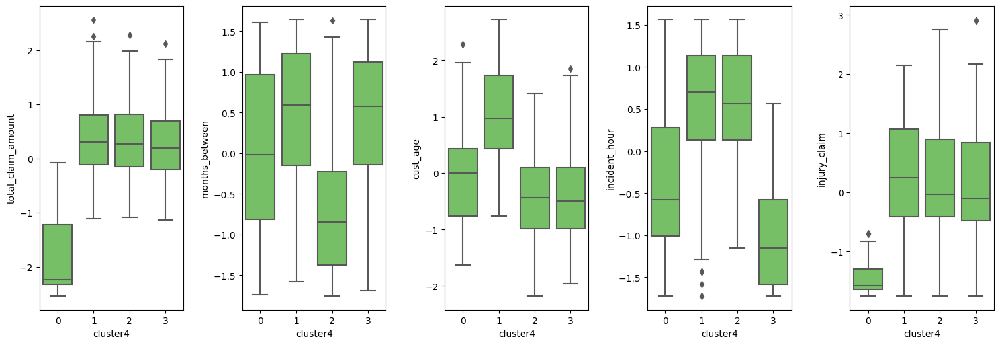

In [87]:
data_num['cluster4'] = kmeans_4.labels_
df['cluster4'] = data_num['cluster4']

f, axes = plt.subplots(1, 5, figsize=[15, 5])
plt.tight_layout(pad=0.4, w_pad=3.0, h_pad=3.0)

columns_to_plot = ['total_claim_amount', 'months_between', 'cust_age', 'incident_hour', 'injury_claim']

for n, col in enumerate(columns_to_plot):
    sns.boxplot(x='cluster4', y=col, data=df, ax=axes[n], color='#6ece58')

plt.show()

In [88]:
#statystyki opisowe dla klastrow
for var in  ['total_claim_amount', 'months_between', 'cust_age', 'incident_hour', 'injury_claim']:
    summary = df.groupby('cluster4')[var].agg(['min', 'max', 'median', 'mean', 'std'])
    summary.index.name = var+' dla klastra'
    print(summary)

                                     min       max    median      mean  \
total_claim_amount dla klastra                                           
0                              -2.533713 -0.080133 -2.235772 -1.870507   
1                              -1.106965  2.557000  0.299387  0.357253   
2                              -1.089674  2.271473  0.266135  0.330170   
3                              -1.132680  2.118956  0.188325  0.255819   

                                     std  
total_claim_amount dla klastra            
0                               0.637627  
1                               0.682037  
2                               0.637690  
3                               0.612284  
                                 min       max    median      mean       std
months_between dla klastra                                                  
0                          -1.744907  1.605585 -0.019066  0.009301  1.022130
1                          -1.576258  1.639315  0.593691  0.469034

In [89]:
categorical_variables = ['bodily_injuries', 'is_accident', '1_vehicle_involved', 'insured_sex_F','emg_services_notified_None', 'emg_services_notified_Other','emg_services_notified_Police', 'property_damage_?','property_damage_NO', 'property_damage_YES']

for variable in categorical_variables:
    contingency_table = pd.crosstab(df['cluster4'], df[variable], normalize='index') * 100
    print(f"Procentowa tabela kontyngencji dla zmiennej {variable}:\n{contingency_table}\n")

Procentowa tabela kontyngencji dla zmiennej bodily_injuries:
bodily_injuries   -1.21537    0.00000    1.21537
cluster4                                        
0                34.615385  30.769231  34.615385
1                41.921397  27.947598  30.131004
2                29.152542  35.254237  35.593220
3                31.600000  33.600000  34.800000

Procentowa tabela kontyngencji dla zmiennej is_accident:
is_accident          0           1
cluster4                          
0            66.923077   33.076923
1             0.000000  100.000000
2             0.000000  100.000000
3             0.000000  100.000000

Procentowa tabela kontyngencji dla zmiennej 1_vehicle_involved:
1_vehicle_involved          0          1
cluster4                                
0                   20.000000  80.000000
1                   52.401747  47.598253
2                   51.864407  48.135593
3                   47.600000  52.400000

Procentowa tabela kontyngencji dla zmiennej insured_sex_F:
insure

**Opis klastrów:**

-zdarzenia losowe nie-wypadki (klaster0)- kradzieże lub zdarzenia związane z zaparkowanym autem, raczej niska całkowita kwota szkody i szkody na osobie, nie ma konieczności wzywania innych służb niż policja, szeroki wykres pudełkowy przy zmiennej mówiącej jak dużo czasu minęło od podpisania polisy do zdarzenia i zmiennej dotyczącej godziny zdarzenia (z naciskiem na poranek, gdy już jest jasno), przeciętny wiek kierowcy

-wypadki ostrożnych dojrzałych kierowców(klaster1)- znacznie wyższy wiek kierowcy, częściej nikt nie ulega szkodzie na osobie, od podpisania polisy minęło już dużo czasu, kwota szkody jest przeciętna, być może minimalnie wyższa dla tego klastra, popołudnie lub wieczór 

-wypadki ryzykownych roztargnionych kierowców (klaster2)- mniej czasu od podpisania polisy do zdarzenia, wiek jest przeciętny (lecz dolny wąs wskazuje, że częściej mogą to być trochę młodsi kierowcy), przeciętna kwota polisy, popołudnie lub wieczór

-wypadki nocnych kierowców (klaster3)- przeciętny wiek, jeżdżących w nocy (mniej więcej od północy do czasu aż wzejdzie słońce). Raczej nic więcej nie jest dla nich charakterystyczne

In [90]:
#Liczba obserwacji w każdym klastrze
Counter(kmeans_4.labels_)

Counter({1: 229, 3: 250, 2: 295, 0: 130})

In [91]:
#Średnie obliczone dla każdej zmiennej
cluster_analysis = data_num.groupby('cluster4').mean()
print(cluster_analysis)

          cust_age  months_between  incident_hour  total_claim_amount  \
cluster4                                                                
0        -0.107971        0.009301      -0.363735           -1.870507   
1         1.057647        0.469034       0.569260            0.357253   
2        -0.443145       -0.715177       0.572913            0.330170   
3        -0.389749        0.409437      -1.008337            0.255819   

          injury_claim  
cluster4                
0            -1.454955  
1             0.348425  
2             0.221067  
3             0.176560  


In [92]:
#Liczba iteracji potrzeba do osiągnięcia zbieżności
kmeans_4.n_iter_

35

In [93]:
#Finalna lokalizacja centroidów
kmeans_4.cluster_centers_

array([[-0.10797057,  0.00930133, -0.36373525, -1.87050741, -1.45495479],
       [ 1.05764706,  0.46903365,  0.56925981,  0.35725323,  0.34842502],
       [-0.44314475, -0.71517662,  0.57291278,  0.3301704 ,  0.22106733],
       [-0.3897492 ,  0.4094369 , -1.00833674,  0.25581881,  0.17655972]])

In [94]:
#Przewidywanie przynależności do klastrów
label = kmeans_4.fit_predict(data_num)
print(label)

[3 3 1 3 1 2 0 2 3 3 1 1 2 1 1 2 3 2 1 3 1 3 2 2 1 0 0 3 2 0 3 1 1 0 3 3 2
 1 1 2 1 2 1 2 3 2 2 2 2 0 2 1 0 1 2 3 0 2 1 3 2 1 1 3 3 3 2 1 2 3 1 2 1 3
 1 0 2 1 2 3 2 0 1 0 0 2 2 0 0 1 2 2 2 3 2 3 1 3 3 3 3 0 2 1 2 2 1 0 0 2 3
 2 1 2 2 2 2 2 3 3 3 2 2 0 1 0 3 1 2 1 1 1 1 0 0 1 3 1 1 2 0 2 3 3 0 2 0 3
 1 2 3 1 1 1 1 0 2 0 2 3 1 3 3 2 2 3 1 1 0 1 2 3 3 2 0 3 1 1 3 0 1 1 1 3 3
 3 2 3 1 2 1 3 2 1 2 1 3 2 0 2 0 2 0 2 3 3 3 2 1 3 2 2 0 2 1 1 0 3 2 0 3 1
 3 1 1 3 1 3 2 2 2 1 3 1 3 1 3 1 0 0 3 2 1 1 2 1 2 1 1 2 1 1 3 2 2 1 1 2 2
 3 1 3 1 0 0 3 3 2 1 2 2 2 1 1 2 2 3 1 1 3 2 2 3 2 3 2 3 3 2 3 0 2 0 2 2 2
 2 2 3 3 1 0 0 2 1 3 1 0 2 1 2 2 2 2 1 2 1 0 2 3 3 2 3 2 1 3 1 0 3 2 2 3 0
 2 0 2 3 2 0 0 1 2 0 2 2 3 3 1 0 3 2 1 2 3 3 2 2 1 3 1 3 2 3 1 2 0 2 2 2 2
 0 1 0 2 0 3 2 0 3 1 2 2 3 1 1 3 3 0 1 2 1 1 3 1 2 2 2 2 2 3 2 2 0 3 1 0 0
 3 1 1 3 3 3 3 2 2 3 1 1 3 2 2 2 3 2 2 3 3 2 1 2 1 2 2 2 3 0 1 1 3 1 1 1 2
 0 1 0 1 2 1 3 1 3 3 2 1 3 1 2 3 0 2 2 1 0 3 1 0 1 1 3 3 3 1 3 3 2 1 0 3 2
 2 2 2 2 3 1 2 1 2 2 3 1 

# Detekcja fraudów

In [96]:
# Zdefiniowanie zestawu zmiennych
fraud = ['policy_id', 'total_claim_amount', 'annual_prem', 'vehicle_age_acc', 'is_not_first_vehicle', 
         'vehicle_claim_proc', 'injury_claim_proc']

X_with_id = data[fraud]
X = X_with_id.drop('policy_id', axis=1)

In [97]:
# Dopasowanie modelu
model = IsolationForest(contamination=0.005, random_state=42)
model.fit(X)

IsolationForest(contamination=0.005, random_state=42)

In [98]:
# Predykcje anomalii
predictions = model.predict(X)

In [99]:
# Anomalie w zbiorze
anomalies = X[predictions == -1]
anomalies = pd.merge(data['policy_id'], anomalies, left_index=True, right_index=True, how='inner')

print("Anomalies:")
pd.DataFrame(anomalies)

Anomalies:


,policy_id,total_claim_amount,annual_prem,vehicle_age_acc,is_not_first_vehicle,vehicle_claim_proc,injury_claim_proc
55,211077,43280,1925.98,20,1,0.875000,0.0
88,73573,37280,1273.50,20,0,1.000000,0.0
95,430152,4400,1006.90,16,0,0.875000,0.0
394,208883,33930,833.13,18,1,0.888889,0.0
749,383388,39690,1096.10,18,0,1.000000,0.0


In [100]:
# Statystyki dla porównania
data[fraud].drop('policy_id', axis=1).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
total_claim_amount,1000.0,52944.201000,26880.796007,100.000000,41812.500000,58055.000000,70592.500000,151632.0
annual_prem,1000.0,1254.516150,244.167395,431.440000,1087.717500,1255.310000,1413.805000,2045.7
vehicle_age_acc,1000.0,10.874000,6.015506,1.000000,6.000000,11.000000,16.000000,21.0
is_not_first_vehicle,1000.0,0.606000,0.488879,0.000000,0.000000,1.000000,1.000000,1.0
vehicle_claim_proc,1000.0,0.722112,0.061271,0.555556,0.692308,0.727273,0.777778,1.0
injury_claim_proc,1000.0,0.139241,0.050661,0.000000,0.100000,0.125000,0.181818,0.3
